## Amazon Products Recommender System.

Amazon is largest E-Commerce website in the world.The products recommendation system is very benifits to the e-commerce companies. Amazons 34-40% of revebue is based on the product recommendations.It may ehances the user to buy two or more products.

Content based recommender system - There are various types of reccomeder system but  here implimented the content based reccomender system.We used different products such as Electronics,clothing ,shoes and jewelry.

## The Data collection and its overview

- We collected the data from http://jmcauley.ucsd.edu/data/amazon/index.html. We signed the agreement to get the meta data of different products. 
- The row represents the data points and column represnts fetures of data.
- The number of rows of clothing ,jewelry and shoes is 190000'
- The number of columns/features is 19
- The number of rows of electronic dataset is 50000
- The number of fetures of electronic datasets is 19
- We merged the both dasets and form new datset.
- The total number of rows in new dataset is : 240000
- The toatl number of features/selected is :5


### We are using 5 features out of 19 features.

#### The Features Description.
- asin : Amazon Product ID
- brand : The product brand
- imageURLHighRes: The url for accesing high resolution image.
- category: The category where product belongs.
- title: The title/text/name of the product

# Import Libraries

In [ ]:
from PIL import Image
import requests
import time
import re
import json
import gzip
from io import BytesIO
from collections import Counter

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

from nltk.corpus import stopwords

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import pairwise_distances


## Read dataset from files to the DataFrame format

### Helper functions

- The data is compressed in gzip files. Besides that, the orignal data is stored in JSON format. Therefore, to read the data, we first need to unzip the file and read it by using json.load. Finally, we read convert it to the DataFrame format

- The json file will processed into dictionary and from dictionary it will return datframe. The orients='index' will gives the output in the 
expected format

  - Input - The file in zip format
  - Output - The dataframe


In [ ]:

def read_json_in_gzip_file(path):
    g = gzip.open(path, 'rb')
    for l in g:
        yield json.loads(l)


def read_data_to_df(path):
    i = 0
    df = {}
    for d in read_json_in_gzip_file(path):
        df[i] = d
        i += 1
        if i == 50000:
            break

    return pd.DataFrame.from_dict(df, orient='index')


### Read the clothing ,shoes,jewlery products are parsing into df dataframe

In [ ]:
df_cloth = read_data_to_df('meta_Clothing_Shoes_and_Jewelry.json.gz')


### Read the electronic josn file processed into df1 dataframe.

In [ ]:
df_elec = read_data_to_df('meta_Electronics.json.gz')


### See the shape of both datasets

In [ ]:
print('meta_Clothing_Shoes_and_Jewelry:',  df_cloth.shape)
print('meta_Electronics:',  df_elec.shape)


meta_Clothing_Shoes_and_Jewelry: (50000, 19)
meta_Electronics: (50000, 19)


### The datasets are merged into new dataframe and concat function is using fr that.

In [ ]:
merged_df = pd.concat([df_cloth, df_elec])

# EDA - Exploratory Data Analysis

## Take a look on the dataset

In [ ]:
merged_df.head(6)


,category,description,title,brand,feature,rank,date,asin,imageURL,imageURLHighRes,also_view,price,fit,also_buy,main_cat,tech1,details,similar_item,tech2
0,"[Clothing, Shoes & Jewelry, Costumes & Accesso...","[6"" long, stretched waist measures 11 1/2"" acr...",Purple Sequin Tiny Dancer Tutu Ballet Dance Fa...,Big Dreams,"[3 layers of tulle, 6"" long, stretched waist m...","19,963,069inClothing,ShoesJewelry(",5 star5 star (0%),0000037214,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,"[Clothing, Shoes & Jewelry, Luggage & Travel G...",[The Hottest Bag in Town! Brand: Anello Condit...,Japan Anello Backpack Unisex LARGE LIGHT GRAY ...,Anello,"[Polyester Canvas Waterproof, Imported, Size: ...","4,537,420inClothing,ShoesJewelry(",5 star,0201377179,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,"[Clothing, Shoes & Jewelry, Luggage & Travel G...",[The Hottest Bag in Town! Brand: Anello Condit...,Japan Anello Backpack Unisex PINK BEIGE LARGE ...,Anello,"[PU Leather, Imported, Size: Large PU Leather ...","3,994,472inClothing,ShoesJewelry(",5 star,0204444454,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,"[B07CJF5HLR, B01EBI8UH6, B01N1LR908, B074M4QKG...",$70.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,"[Clothing, Shoes & Jewelry, Luggage & Travel G...",[The Hottest Bag in Town! Brand: Anello Condit...,Japan Anello Backpack Unisex BLACK LARGE PU LE...,Anello,"[PU Leather, Imported, Size: Large PU Leather ...","635,761inClothing,ShoesJewelry(",5 star,0204444403,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,"[B01DLVYOPG, B07CJF5HLR, B01MSS59Y6, B071YBC1J...",$65.99,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,"[Clothing, Shoes & Jewelry, Novelty & More, Cl...",[Brand New. Hat Centre Length: adult about 8c...,bettyhome Unisex Adult Winter Spring Thicken C...,bettyhome,"[Imported, Plush,Cotton, Polyester, Lovely for...","5,061,041inClothing,ShoesJewelry(",5 star5 star (0%),0206313535,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,"[B00VGT93YS, B07FTY87LM, B01IKVOY8E, B01GF6C6F...",$18.99,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,"[Clothing, Shoes & Jewelry, Women, Clothing, S...",[Please allow 1-2cm dimension deviation. 100% ...,bettyhome Womens Lace Short Sleeves Top Printi...,bettyhome,"[Imported, Bohemia style, butterfly printing, ...","10,635,107inClothing,ShoesJewelry(",5 star,0206335962,[https://images-na.ssl-images-amazon.com/image...,[https://images-na.ssl-images-amazon.com/image...,NaN,$23.99,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## List out all column names

In [ ]:
merged_df.columns


Index(['category', 'description', 'title', 'brand', 'feature', 'rank', 'date',
       'asin', 'imageURL', 'imageURLHighRes', 'also_view', 'price', 'fit',
       'also_buy', 'main_cat', 'tech1', 'details', 'similar_item', 'tech2'],
      dtype='object')

## Select 5 features for analysing

In [ ]:
df_data = merged_df[['asin', 'brand', 'imageURLHighRes', 'category', 'title']]

df_data


,asin,brand,imageURLHighRes,category,title
0,0000037214,Big Dreams,NaN,"[Clothing, Shoes & Jewelry, Costumes & Accesso...",Purple Sequin Tiny Dancer Tutu Ballet Dance Fa...
1,0201377179,Anello,[https://images-na.ssl-images-amazon.com/image...,"[Clothing, Shoes & Jewelry, Luggage & Travel G...",Japan Anello Backpack Unisex LARGE LIGHT GRAY ...
2,0204444454,Anello,[https://images-na.ssl-images-amazon.com/image...,"[Clothing, Shoes & Jewelry, Luggage & Travel G...",Japan Anello Backpack Unisex PINK BEIGE LARGE ...
3,0204444403,Anello,[https://images-na.ssl-images-amazon.com/image...,"[Clothing, Shoes & Jewelry, Luggage & Travel G...",Japan Anello Backpack Unisex BLACK LARGE PU LE...
4,0206313535,bettyhome,[https://images-na.ssl-images-amazon.com/image...,"[Clothing, Shoes & Jewelry, Novelty & More, Cl...",bettyhome Unisex Adult Winter Spring Thicken C...
...,...,...,...,...,...
49995,B00009V6QR,Arista,[https://images-na.ssl-images-amazon.com/image...,"[Electronics, Accessories &amp; Supplies, Audi...",Arista 18-315 10 feet 3.5mm Headphone Extensio...
49996,B00009V4G6,Canon,[],"[Electronics, Camera & Photo, Accessories, Bat...",Canon CG570 Battery Charger for the 500 series...
49997,B00009V4FZ,Canon,[https://images-na.ssl-images-amazon.com/image...,"[Electronics, Camera &amp; Photo, Lenses, Camc...","Canon 16x IS II Video Zoom Lens for XL1, XL1S,..."
49998,B00009V7H2,Brother,[https://images-na.ssl-images-amazon.com/image...,"[Electronics, Computers &amp; Accessories, Com...",Brother NC9100H Network Lan Board Printer Acce...


## Some of the columns containing values inside the list and this has to be removed to further process.

In [ ]:
df_data = df_data.applymap(lambda x: x if not isinstance(
    x, list) else x[0] if len(x) else '')
    
# The dataframe after processing and the category column printed correctly.
df_data


,asin,brand,imageURLHighRes,category,title
0,0000037214,Big Dreams,NaN,"Clothing, Shoes & Jewelry",Purple Sequin Tiny Dancer Tutu Ballet Dance Fa...
1,0201377179,Anello,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",Japan Anello Backpack Unisex LARGE LIGHT GRAY ...
2,0204444454,Anello,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",Japan Anello Backpack Unisex PINK BEIGE LARGE ...
3,0204444403,Anello,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",Japan Anello Backpack Unisex BLACK LARGE PU LE...
4,0206313535,bettyhome,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",bettyhome Unisex Adult Winter Spring Thicken C...
...,...,...,...,...,...
49995,B00009V6QR,Arista,https://images-na.ssl-images-amazon.com/images...,Electronics,Arista 18-315 10 feet 3.5mm Headphone Extensio...
49996,B00009V4G6,Canon,,Electronics,Canon CG570 Battery Charger for the 500 series...
49997,B00009V4FZ,Canon,https://images-na.ssl-images-amazon.com/images...,Electronics,"Canon 16x IS II Video Zoom Lens for XL1, XL1S,..."
49998,B00009V7H2,Brother,https://images-na.ssl-images-amazon.com/images...,Electronics,Brother NC9100H Network Lan Board Printer Acce...


## The caegory column is understanding  using descibe function
- Total number of rows is 100000
- Two unique features
- Top feature is Clothing, Shoes & Jewelry


In [ ]:
print(df_data['category'].describe())


count          100000
unique              2
top       Electronics
freq            50000
Name: category, dtype: object


## Make sure we have exactly two categories in the dataset

In [ ]:
print(df_data['category'].unique())

['Clothing, Shoes & Jewelry' 'Electronics']


## The brand column is understanding using descibe function

In [ ]:
# The brand column is understanding b using descibe function
# Total number of element is 181697
# 12805 unique features
# top brand is Amazon Collection
print(df_data['brand'].describe())


count     84786
unique     6544
top        Sony
freq       3001
Name: brand, dtype: object


## Top 10 brands in datasets and its counts of occuring.

[Text(0.5, 0, 'Brands'),
 Text(0, 0.5, 'Number of products'),
 Text(0.5, 1.0, 'The most popular brands')]

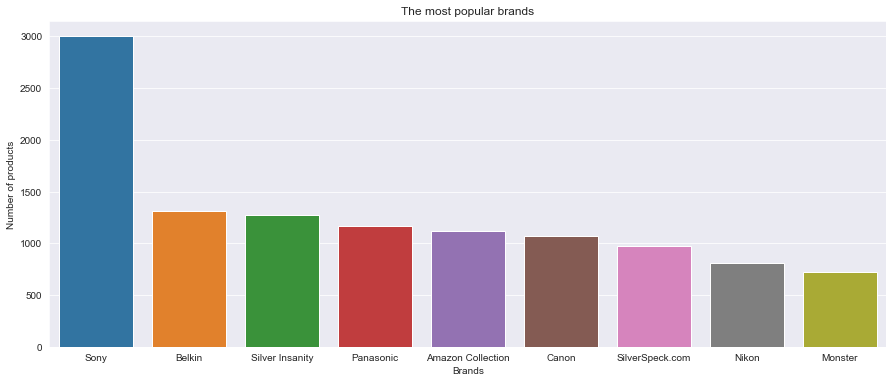

In [ ]:
brand_count = Counter(list(df_data['brand']))

most_popular_brands = brand_count.most_common(10)

x = [tag for tag, count in most_popular_brands]
y = [count for tag, count in most_popular_brands]

plt.figure(figsize=(15,6))
sns.set_style("darkgrid")
ax = sns.barplot(x = x, y = y)
ax.set(xlabel='Brands', ylabel='Number of products', title='The most popular brands')


## Almost all products have title.
- The title is used for futher analsysis and recommeder as it contains short desciption.
- The top title is Wrangler Men's Cowboy Cut Slim Fit Jean

In [ ]:
print(df_data['title'].describe())

count                                          100000
unique                                          76468
top       Rainbow Sandals Double Layer Leather Sandal
freq                                               46
Name: title, dtype: object


# Feature Engineering

## Check there is any missing values in the dataframe.

In [ ]:
# the brand feature contains 58303  missing vales
# The 62128 imageurls are missing#
# 2 title vales are missing.

df_data.isnull().sum()

asin                   0
brand              15214
imageURLHighRes    18835
category               0
title                  0
dtype: int64

## Remove the  missing values in brand column

In [ ]:
print('Before:', df_data.shape[0])
df_data = df_data.loc[~df_data['brand'].isnull()]

print('Number of data points After eliminating brand=NULL :', df_data.shape[0])


Before: 100000
Number of data points After eliminating brand=NULL : 84786


## Remove records without image
- In this particular project, we want to work with data with image so that we can have better visulization about results by looking at the images

### Remove the  missing values in imageURLHighRes column

In [ ]:
print('Before:', df_data.shape[0])
df_data = df_data.loc[~df_data['imageURLHighRes'].isnull()]
print('Number of data points After eliminating imageURLHighRes=NULL :',
      df_data.shape[0])


Before: 84786
Number of data points After eliminating imageURLHighRes=NULL : 70984


### Remove the  ' ' in imageURLHighRes column

In [ ]:
print('Before:', df_data.shape[0])
df_data = df_data[df_data['imageURLHighRes'] != '']
print('Number of data points After eliminating imageURLHighRes=NULL :',
      df_data.shape[0])


Before: 70984
Number of data points After eliminating imageURLHighRes=NULL : 45052


## Remove the  missing values in title column

In [ ]:
print('Before:', df_data.shape[0])
df_data = df_data.loc[~df_data['title'].isnull()]
print('Number of data points After eliminating title=NULL :', df_data.shape[0])


Before: 45052
Number of data points After eliminating title=NULL : 45052


In [ ]:
df_data.head(6)

,asin,brand,imageURLHighRes,category,title
1,0201377179,Anello,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",Japan Anello Backpack Unisex LARGE LIGHT GRAY ...
2,0204444454,Anello,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",Japan Anello Backpack Unisex PINK BEIGE LARGE ...
3,0204444403,Anello,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",Japan Anello Backpack Unisex BLACK LARGE PU LE...
4,0206313535,bettyhome,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",bettyhome Unisex Adult Winter Spring Thicken C...
5,0206335962,bettyhome,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",bettyhome Womens Lace Short Sleeves Top Printi...
6,0206323190,bettyhome,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",bettyhome Women Sexy Club Party Super High Hee...


## The sorted data

In [ ]:

data_sorted = df_data[df_data['title'].apply(lambda x: len(x.split()) > 4)]
print("After removal of products with short description:",
      data_sorted.shape[0])


After removal of products with short description: 40911


## Sort the whole data based on title (alphabetical order of title) 

In [ ]:
data_sorted.sort_values('title', inplace=True, ascending=False)

data_sorted.head(6)


<ipython-input-90-420cd24e6cfd>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_sorted.sort_values('title', inplace=True, ascending=False)


,asin,brand,imageURLHighRes,category,title
40044,B000LQIGEU,zinc,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",zinc Women's Melissa Pump with Ankle Strap
768,B0000A4FCF,zephz,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",zephz Butterfly Lo Cheerleading Shoe Kids
4472,B0000A4FCF,zephz,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",zephz Butterfly Lo Cheerleading Shoe Kids
22118,B000F5XUFM,Elegant,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",y2 Elegant n Unique - Lace Halter Mini Dress O...
26931,B000GJS16A,ecko unltd by Marc Ecko,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",unltd. by marc ecko Men's Pratique Fashion Sne...
26937,B000GJT3KS,ecko unltd by Marc Ecko,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",unltd. by marc ecko Men's Phranz-Phuel Chukka ...


## Visualize our dataset after the preprocessing step

[Text(0, 0, '24068'), Text(0, 0, '20984')]

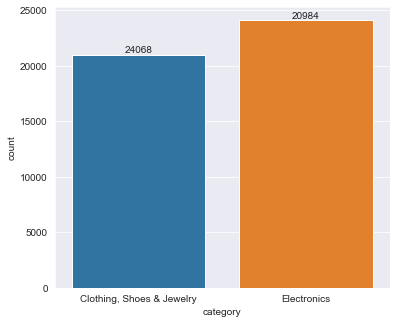

In [ ]:


abs_values = df_data['category'].value_counts(ascending=False)
rel_values = df_data['category'].value_counts(
    ascending=False, normalize=True).values * 100
lbls = [f'{p[0]} ({p[1]:.0f}%)' for p in zip(abs_values, rel_values)]

plt.subplots_adjust(top=1.1)

ax = sns.countplot(data=df_data, x="category")
ax.bar_label(container=ax.containers[0], labels=abs_values)


# Text Preprocessing

In [ ]:
stop_words = set(stopwords.words('english'))  # English stop words.
print('list of stop words:', stop_words)

# The function to process the text.
# input - The tet,index and column.
# output -preprocessed text and put it into corresponding column.


def text_processing(text_, index, column):
    if type(text_) is not int:
        string = ""
        for words in text_.split():
            # remove the special chars in review like '"#$@!%^&*()_+-~?>< etc.
            word = ("".join(e for e in words if e.isalnum()))
            # Conver all letters to lower-case
            word = word.lower()
            # stop-word removal
            if not word in stop_words:
                string += word + " "
        data_sorted[column][index] = string


list of stop words: {'those', 'me', 'them', 'have', 'myself', 'few', 'after', 'now', 'by', 'who', 'only', "it's", 'this', 'your', 'into', 'himself', 'aren', 'not', 'having', 'does', 'o', 'again', 'were', "shouldn't", 'did', 'had', 'mustn', 'out', "couldn't", 'there', 'than', 's', 'should', "shan't", 'here', 'any', 'as', 'before', 't', 'how', 'for', "you'd", 'but', "mustn't", 'wouldn', "won't", 'our', 'while', 'doing', 'ours', 'are', "mightn't", 'other', 'hadn', 'a', 'what', 'my', 'whom', 'under', 'was', 'own', 'll', 'mightn', 'these', 'in', 'been', 'wasn', 'from', "weren't", 're', 'where', 'until', "hadn't", 'no', 'very', 'ourselves', 'yourselves', 'has', 'over', "don't", 'his', 'through', "isn't", 'she', 'ain', 'an', 'too', "needn't", "should've", 'because', 'nor', 'do', 'the', 'both', "didn't", 'we', 'they', "that'll", 'once', 'against', 'couldn', 'on', 'i', 'isn', 'theirs', 'each', 'won', 'then', 'same', "wouldn't", 'it', 'm', 'off', 'y', "doesn't", 'being', "haven't", 'hers', 'itse

In [ ]:
start_time = time.process_time()

# we take each title and we text-preprocess it.
for index, row in data_sorted.iterrows():
    text_processing(row['title'], index, 'title')

# we print the time it took to preprocess whole titles

print(time.process_time() - start_time, "seconds")
# The total time taken for preprocessing text is 6919.25seconds which is around 2 hrs.


<ipython-input-93-2d531af4716d>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  text_processing(row['title'], index, 'title')
<ipython-input-93-2d531af4716d>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  text_processing(row['title'], index, 'title')
<ipython-input-93-2d531af4716d>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  text_processing(row['title'], index, 'title')
<ipython-input-93-2d531af4716d>:5: SettingWithCopyWarning:

80.25 seconds


<ipython-input-93-2d531af4716d>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  text_processing(row['title'], index, 'title')
<ipython-input-93-2d531af4716d>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  text_processing(row['title'], index, 'title')
<ipython-input-93-2d531af4716d>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  text_processing(row['title'], index, 'title')
<ipython-input-93-2d531af4716d>:5: SettingWithCopyWarning:

## The dataframe after preprocessing the text. 

In [ ]:
data_sorted.head()


,asin,brand,imageURLHighRes,category,title
40044,B000LQIGEU,zinc,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",zinc womens melissa pump ankle strap
768,B0000A4FCF,zephz,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",zephz butterfly lo cheerleading shoe kids
4472,B0000A4FCF,zephz,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",zephz butterfly lo cheerleading shoe kids
22118,B000F5XUFM,Elegant,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",y2 elegant n unique lace halter mini dress one...
26931,B000GJS16A,ecko unltd by Marc Ecko,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",unltd marc ecko mens pratique fashion sneaker


## Finding electronic category feature.

In [ ]:
data_sorted[data_sorted['category'] == 'Electronics']


,asin,brand,imageURLHighRes,category,title
1460,9896740054,D-Logic,https://images-na.ssl-images-amazon.com/images...,Electronics,ufr rfid reader writer 1356 mhz mifare nfc co...
25739,B0001M0HBE,tesa UK,https://images-na.ssl-images-amazon.com/images...,Electronics,tesa uk tesa extra power grey cloth repair tap...
28294,B0002AH0PG,reEVOlution,https://images-na.ssl-images-amazon.com/images...,Electronics,reevolutions iskin case ipod mini ebony black
31798,B0002XN73M,reEVOlution,https://images-na.ssl-images-amazon.com/images...,Electronics,reevolution iskin evo2 ipod 40 gb ebony
31808,B0002XN74G,reEVOlution,https://images-na.ssl-images-amazon.com/images...,Electronics,reevolution iskin evo2 silicone case 40 gb ipo...
...,...,...,...,...,...
21350,B0000ASRIK,IBM,https://images-na.ssl-images-amazon.com/images...,Electronics,05k6187 ibm external floppy drive cover thinkp...
24324,B000165O0O,SUNPAK,https://images-na.ssl-images-amazon.com/images...,Electronics,045x wide angle conversion lens
28656,B0002CSSAK,Pelican,https://images-na.ssl-images-amazon.com/images...,Electronics,0350 pelican cube case foam
185,094339676X,33 Books Co.,https://images-na.ssl-images-amazon.com/images...,Electronics,moleskine luggage light travel tag cerulean bl...


## Saving the data into csv for further analysis.

In [ ]:
data_sorted.to_csv('Amazon_sorted_data.csv', index=False)


## Reading the products datset.

In [ ]:
data_sorted = pd.read_csv("Amazon_sorted_data.csv")


In [ ]:
data_sorted.head()


,asin,brand,imageURLHighRes,category,title
0,B000LQIGEU,zinc,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",zinc womens melissa pump ankle strap
1,B0000A4FCF,zephz,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",zephz butterfly lo cheerleading shoe kids
2,B0000A4FCF,zephz,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",zephz butterfly lo cheerleading shoe kids
3,B000F5XUFM,Elegant,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",y2 elegant n unique lace halter mini dress one...
4,B000GJS16A,ecko unltd by Marc Ecko,https://images-na.ssl-images-amazon.com/images...,"Clothing, Shoes & Jewelry",unltd marc ecko mens pratique fashion sneaker


# Word Embedding Techniques

- In the modeling we are trying to tain the tile text to identify the similiar products. Here we use two word embedding techniques such as Bag of Words and TF-IDF.
- Bag of words : The basic and simplest word embeding technique.
- tfidf - It is one of the bag of words approach. The tf-idf method we can find the ocuuremace of word in given document and the frequency in other docs. Here two values is using term frequency and inverse document frequency.
- term frequency  = (Number of Occurences of a word)/(Total words in the document)
- inverse document frequency = Log((Total number of documents)/(Number of documents containing the word))
- So the tfidf = term frequency  * inverse document frequency

## Import count vectorizer

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

title_vectorizer = CountVectorizer()
title_features = title_vectorizer.fit_transform(data_sorted['title'])


## Check the feature matrix's shape: rows and columns

In [ ]:
title_features.get_shape()


(40911, 32372)

## In order to features.

In [ ]:
title_vectorizer.vocabulary_


{'zinc': 32272,
 'womens': 31549,
 'melissa': 19895,
 'pump': 23661,
 'ankle': 7196,
 'strap': 27477,
 'zephz': 32256,
 'butterfly': 9075,
 'lo': 18820,
 'cheerleading': 10139,
 'shoe': 26024,
 'kids': 17992,
 'y2': 32030,
 'elegant': 13396,
 'unique': 29977,
 'lace': 18313,
 'halter': 16041,
 'mini': 20138,
 'dress': 12479,
 'one': 21656,
 'size': 26244,
 'queen': 23910,
 'plus': 22987,
 'black': 8404,
 'white': 31315,
 'unltd': 30001,
 'marc': 19492,
 'ecko': 13213,
 'mens': 19912,
 'pratique': 23283,
 'fashion': 14300,
 'sneaker': 26712,
 'phranzphuel': 22754,
 'chukka': 10253,
 'boot': 8654,
 'maskswitchback': 19572,
 'casual': 9643,
 'carving': 9606,
 'umi': 29942,
 'toddlerlittle': 29114,
 'kid': 17981,
 'finn': 14513,
 'sandal': 25171,
 'cornflower': 10863,
 'quiltee': 23930,
 'elaina': 13367,
 'ii': 17000,
 'ballet': 7928,
 'flat': 14619,
 'little': 18793,
 'kidbig': 17986,
 'ufr': 29852,
 'rfid': 24506,
 'reader': 24249,
 'writer': 31673,
 '1356': 977,
 'mhz': 20013,
 'mifare'

## Helper functions

In [ ]:

# Display an image
#input - Url
def display_img(url, ax, fig):
    # we get the url of the apparel and download it
    response = requests.get(url)
    img = Image.open(BytesIO(response.content))
    # we will display it in notebook
    plt.imshow(img)  # matplotlib plt functionto display

# to draw heatmap to better undersanding of similiar items based on words.


def plot_heatmap(keys, values, labels, url, text):
    # keys: list of words of recommended title
    # values: len(values) ==  len(keys), values(i) represents the occurence of the word keys(i)
    # labels: len(labels) == len(keys), the values of labels depends on the model we are using
    # if model == 'bag of words': labels(i) = values(i)
    # if model == 'tfidf ':labels(i) = tfidf(keys(i))
    # url : ImageHighres url

    # we will devide the whole figure into two parts
    gs = gridspec.GridSpec(2, 2, width_ratios=[4, 1], height_ratios=[4, 1])
    fig = plt.figure(figsize=(25, 3))

    # 1st, ploting heat map that represents the count of commonly ocurred words in title2
    ax = plt.subplot(gs[0])
    # it displays a cell in white color if the word is intersection(lis of words of title1 and list of words of title2), in black if not
    ax = sns.heatmap(np.array([values]), annot=np.array([labels]))
    # sns is using for showing heatmap.
    ax.set_xticklabels(keys)  # set that axis labels as the words of title
    ax.set_title(text)  # title

    # 2nd, plotting image of the product
    ax = plt.subplot(gs[1])
    # we don't want any grid lines for image and no labels on x-axis and y-axis
    ax.grid(False)
    ax.set_xticks([])
    ax.set_yticks([])

    # we call dispaly_img based with paramete url
    display_img(url, ax, fig)

    # displays combine figure ( heat map and image together)
    plt.show()


def plot_heatmap_image(doc_id, vec1, vec2, url, text, model):

    # doc_id : index of the title in corpus
    # vec1 : input apparels's vector, it is of a dict type {word:count}
    # vec2 : recommended apparels's vector, it is of a dict type {word:count}
    # url : apparels image url
    # text: title of recomonded apparel (used to keep title of image)
    # model, it can be any of the models,
    # 1. bag_of_words
    # 2. tfidf
    # 3. idf

    # we find the common words in both titles, because these only words contribute to the distance between two title vec's
    intersection = set(vec1.keys()) & set(vec2.keys())

    # we set the values of non intersecting words to zero, this is just to show the difference in heatmap
    for i in vec2:
        if i not in intersection:
            vec2[i] = 0

    # for labeling heatmap, keys contains list of all words in title2
    keys = list(vec2.keys())
    #  if ith word in intersection(lis of words of title1 and list of words of title2): values(i)=count of that word in title2 else values(i)=0
    values = [vec2[x] for x in vec2.keys()]

    # labels: len(labels) == len(keys), the values of labels depends on the model we are using
    # if model == 'bag of words': labels(i) = values(i)
    # if model == 'tfidf weighted bag of words':labels(i) = tfidf(keys(i))

    if model == 'bag_of_words':
        labels = values
    elif model == 'tfidf':
        labels = []
        for x in vec2.keys():
            # tfidf_title_vectorizer.vocabulary_ it contains all the words in the corpus
            # tfidf_title_features[doc_id, index_of_word_in_corpus] will give the tfidf value of word in given document (doc_id)
            if x in tfidf_title_vectorizer.vocabulary_:
                labels.append(
                    tfidf_title_features[doc_id, tfidf_title_vectorizer.vocabulary_[x]])
            else:
                labels.append(0)

    plot_heatmap(keys, values, labels, url, text)  # plotting heatmap.


# this function gets a list of wrods along with the frequency of each
# word given "text"
def text_to_vector(text):
    word = re.compile(r'\w+')
    words = word.findall(text)
    # words stores list of all words in given string, you can try 'words = text.split()' this will also gives same result
    # Counter counts the occurence of each word in list, it returns dict type object {word1:count}
    return Counter(words)


# Function to get the similar items based on text.
def get_result(doc_id, content_a, content_b, url, model):
    text1 = content_a
    text2 = content_b

    # vector1 = dict{word11:#count, word12:#count, etc.}
    vector1 = text_to_vector(text1)

    # vector1 = dict{word21:#count, word22:#count, etc.}
    vector2 = text_to_vector(text2)

    plot_heatmap_image(doc_id, vector1, vector2, url, text2, model)


## Bag of Words

- The basic and simples model
- We are trying to map the words into vectors and find the dot product and eucledean distance between the words. So the  smallest distance words are similar. 
- The formula for eucledian distance is ![image-4.png](attachment:image-4.png)


In [ ]:
def bag_of_words_model(doc_id, num_results):
    # doc_id: product id in given corpus
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    pairwise_dist = pairwise_distances(title_features, title_features[doc_id])
    # the distance between the words calculation.

    # np.argsort will return indices of the smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    # pdists will store the smallest distances
    pdists = np.sort(pairwise_dist.flatten())[0:num_results]

    # data frame indices of the 9 smallest distace's
    df_indices = list(data_sorted.index[indices])

    for i in range(0, len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i], data_sorted['title'].loc[df_indices[0]], data_sorted['title'].loc[df_indices[i]],
                   data_sorted['imageURLHighRes'].loc[df_indices[i]], 'bag_of_words')
        print('ASIN :', data_sorted['asin'].loc[df_indices[i]])
        print('Brand:', data_sorted['brand'].loc[df_indices[i]])
        print('Title:', data_sorted['title'].loc[df_indices[i]])
        print('Euclidean similarity with the query image :', pdists[i])
        print('='*60)


### Test BoW - Find 4 similar items of a give item

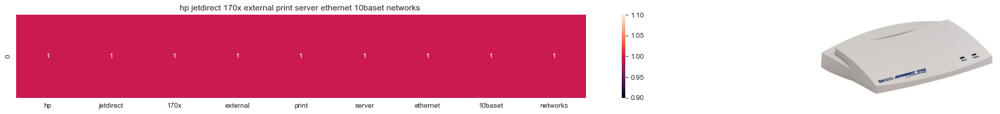

ASIN : B00004Z8J7
Brand: Hewlett Packard
Title: hp jetdirect 170x external print server ethernet 10baset networks 
Euclidean similarity with the query image : 0.0


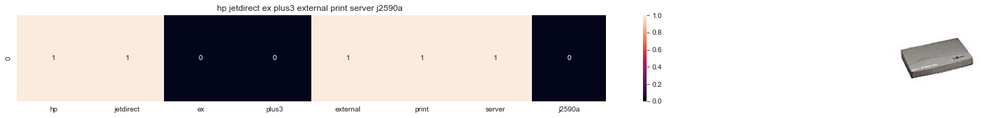

ASIN : B0002AELNK
Brand: HP
Title: hp jetdirect ex plus3 external print server j2590a 
Euclidean similarity with the query image : 2.6457513110645907


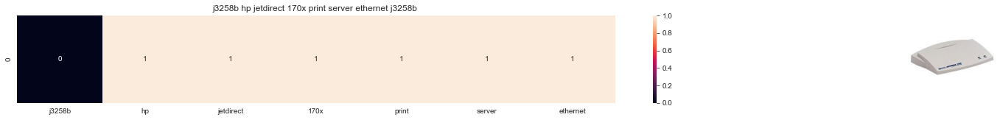

ASIN : B0002AEMAM
Brand: HP
Title: j3258b hp jetdirect 170x print server ethernet j3258b 
Euclidean similarity with the query image : 2.6457513110645907


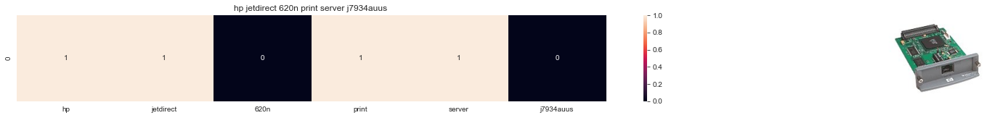

ASIN : B000213ZFE
Brand: Hewlett Packard
Title: hp jetdirect 620n print server j7934auus 
Euclidean similarity with the query image : 2.6457513110645907


In [ ]:
bag_of_words_model(26586, 4)


## TF-IDF

### Creating tf-idf vectorizer.

In [ ]:
# Creating tfidf vectorizer.
tfidf_title_vectorizer = TfidfVectorizer(min_df=0)

# Get the features of title text. The word is he feature here.
tfidf_title_features = tfidf_title_vectorizer.fit_transform(
    data_sorted['title'])


In [ ]:
def tfidf_model(doc_id, num_results):
    # doc_id: product id in given corpus
    # pairwise_dist will store the distance from given input apparel to all remaining apparels
    pairwise_dist = pairwise_distances(
        tfidf_title_features, tfidf_title_features[doc_id])

    # np.argsort will return indices of smallest distances
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    # pdists will store the smallest distances
    pdists = np.sort(pairwise_dist.flatten())[0:num_results]

    df_indices = list(data_sorted.index[indices])

    for i in range(0, len(indices)):
        # we will pass 1. doc_id, 2. title1, 3. title2, url, model
        get_result(indices[i], data_sorted['title'].loc[df_indices[0]], data_sorted['title']
                   .loc[df_indices[i]], data_sorted['imageURLHighRes'].loc[df_indices[i]], 'tfidf')
        print('ASIN :', data_sorted['asin'].loc[df_indices[i]])
        print('BRAND :', data_sorted['brand'].loc[df_indices[i]])
        print('Title:', data_sorted['title'].loc[df_indices[i]])
        print('Eucliden distance from the given image :', pdists[i])
        print('='*125)


### Test TF-IDF - Find 4 similar items of a give item

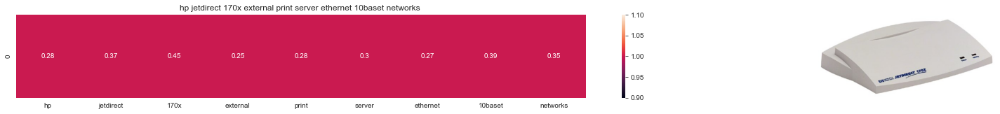

ASIN : B00004Z8J7
BRAND : Hewlett Packard
Title: hp jetdirect 170x external print server ethernet 10baset networks 
Eucliden distance from the given image : 0.0


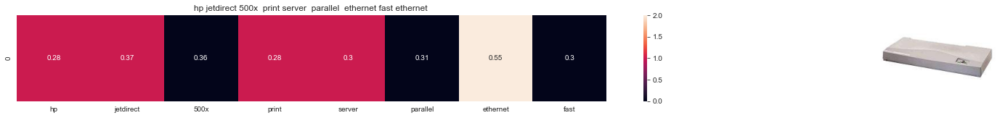

ASIN : B0002AEK68
BRAND : HP
Title: hp jetdirect 500x  print server  parallel  ethernet fast ethernet 
Eucliden distance from the given image : 0.9635269887069929


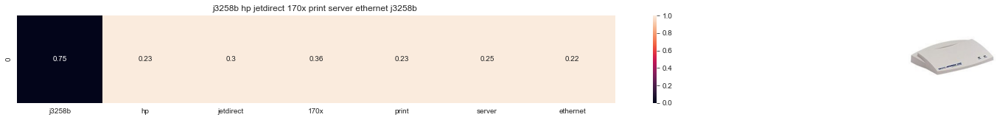

ASIN : B0002AEMAM
BRAND : HP
Title: j3258b hp jetdirect 170x print server ethernet j3258b 
Eucliden distance from the given image : 0.963677476512018


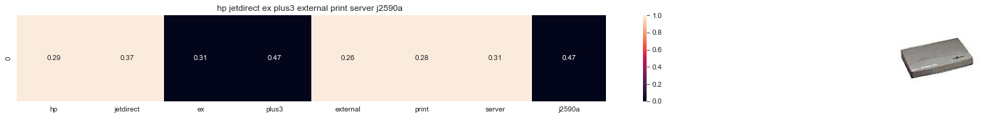

ASIN : B0002AELNK
BRAND : HP
Title: hp jetdirect ex plus3 external print server j2590a 
Eucliden distance from the given image : 1.0424841772395503


In [ ]:
tfidf_model(26586, 4)


# Conclusions

- From word embedding techniques we can analyse that our recommder system gives similar product results and when comapring two algorithms, bag of words and tfidf. The tfidf performs better than Bagof words.  The word embedding techniques can used for making recommnder systems. The texts are converted into vectors and identif the relashionships between the words. The eucledean distance is used for finding teh distance of words. 
 
- We anaysied a large datapoints inclsing electronics,jewlry,shoes and clothing. 

- The results works very well. The similarity of women loafer is listed. The images are displayed based on the URL. 

- Our recommder system will benifit for finding other products types based on title.reviews etc.

